<a href="https://colab.research.google.com/github/SRINIVASDEVARAJULA/Technical-task/blob/main/model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
pip install chart-studio

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.4/64.4 kB 2.7 MB/s eta 0:00:00


In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib as plt
%matplotlib inline
from sklearn.metrics import classification_report,confusion_matrix
from __future__ import division
from sklearn.cluster import KMeans
import plotly.graph_objs as go
#import plotly.plotly as py
import plotly.offline as pyoff
import plotly.graph_objs as go

In [ ]:
df=pd.read_csv("anon_mod.csv")


In [ ]:
df.shape

(59070, 14)

In [ ]:
# Convert the 'ShipDate' column to datetime format
df['ShipDate'] = pd.to_datetime(df['ShipDate'])

# Now you can use the .dt accessor on the 'ShipDate' column
print(df['ShipDate'].dt.year)

0        2021
1        2021
2        2021
3        2021
4        2021
         ... 
59065    2021
59066    2021
59067    2021
59068    2021
59069    2021
Name: ShipDate, Length: 59070, dtype: int64


In [ ]:
# Filter out rows with ShipDate in 2023
df = df[df['ShipDate'].dt.year != 2023]

In [ ]:
df.shape

(59070, 14)

In [ ]:
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,year,month_year
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,0.0,Components North,2021.0,2021-02
1,100003323,2918083,50,2021-02-04,1,Microsoft,Utilities Software,1000477.0,191.682001,6.179373,0.0,Corporate North,2021.0,2021-02
2,100016168,2916878,20,2021-02-04,1,Unknown,IT Support Services,1000465.0,0.000000,-8.011783,0.0,Corporate North,2021.0,2021-02
3,100001590,2470475,10,2021-02-04,10,Lenovo,Notebook Computers,1000133.0,21362.979640,133.944138,0.0,Corporate South,2021.0,2021-02
4,100001590,2544987,10,2021-02-04,5,Lenovo,Notebook Computers,1000133.0,4344.370602,27.639497,0.0,Corporate South,2021.0,2021-02


In [ ]:
df.nunique()

CustomerId               1653
SalesOrderNumber        43605
SalesOrderLineNumber       86
ShipDate                   63
Qty                       350
Brand                     232
ProductType               360
ProductSupplierID         223
Revenue                 59013
Profit                  58993
Freight cost             2488
SalesTeamName               8
year                        1
month_year                 12
dtype: int64

In [ ]:
df["ShipDate"] = pd.to_datetime(df["ShipDate"])

In [ ]:
df=df[df.Revenue>0]

In [ ]:
df.shape

(56413, 14)

In [ ]:
# Determine the most recent date in the dataset
most_recent_date = df["ShipDate"].max()

# Calculate the number of days since each customer's last purchase
recency = df.groupby("CustomerId")["ShipDate"].apply(lambda x: (most_recent_date - x.max()).days).reset_index(name='Recency')
# Calculate Frequency
frequency = df.groupby('CustomerId')['SalesOrderNumber'].nunique().reset_index(name='Frequency')

# Calculate Monetary Value
monetary_value = df.groupby('CustomerId')['Revenue'].sum().reset_index(name='MonetaryValue')

In [ ]:
df = pd.merge(df, recency, on="CustomerId")
df = pd.merge(df, frequency, on="CustomerId")
df = pd.merge(df, monetary_value, on="CustomerId")

In [ ]:
df.nunique()

CustomerId               1623
SalesOrderNumber        41537
SalesOrderLineNumber       60
ShipDate                   62
Qty                       279
Brand                     224
ProductType               355
ProductSupplierID         217
Revenue                 56413
Profit                  56343
Freight cost             2486
SalesTeamName               7
year                        1
month_year                 12
Recency                    51
Frequency                 114
MonetaryValue            1623
dtype: int64

In [ ]:
df.groupby("CustomerId").agg({'Recency': 'mean', 'Frequency': 'mean', 'MonetaryValue': 'mean'})

,Recency,Frequency,MonetaryValue
CustomerId,,,
100000003,302.0,1.0,30.505428
100000005,236.0,1.0,76.229306
100000015,226.0,1.0,764.883644
100000034,1.0,6.0,35760.771317
100000037,214.0,1.0,457.207885
...,...,...,...
100019297,30.0,1.0,271.384096
100019319,194.0,2.0,6093.068791
100019336,192.0,3.0,2457.597094


In [ ]:
df.Recency.describe()

count    56413.000000
mean        16.053711
std         47.959256
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        333.000000
Name: Recency, dtype: float64

 with a minimum of 1 day and a maximum of 724 days. The mean Recency is 12.76 days and the median (50%) is 1 day, which suggests that the majority of customers made a purchase very recently. The standard deviation of 50.89 days indicates that there is some variation in Recency values among customers, with some having made a purchase much longer ago than others. The quartiles indicate that 75% of the customers made a purchase within the past 8 days.

In [ ]:
ax= sns.distplot

In [ ]:
df.Frequency.describe()

count    56413.000000
mean      1836.801695
std       2158.311838
min          1.000000
25%         62.000000
50%        820.000000
75%       2802.000000
max       5986.000000
Name: Frequency, dtype: float64

Based on the output of the describe() method, we can see that the mean frequency of purchases is 11,155 and the median frequency is 4,841. The maximum frequency is 38,545 and the minimum is 1. The standard deviation is 13,188 which is quite high, indicating a wide range of frequency values.

<ipython-input-20-5271678ab3da>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




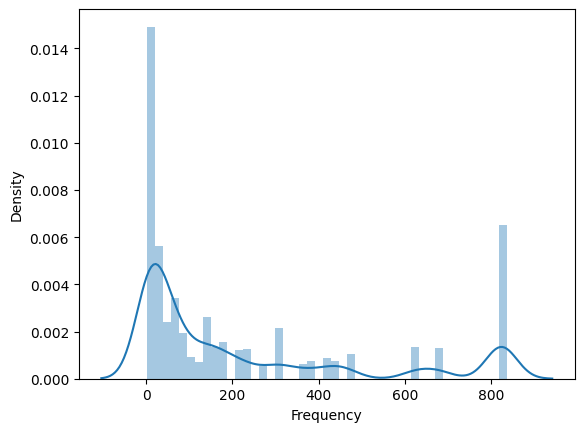

In [ ]:
x = df.query('Frequency < 1000')['Frequency']

ax = sns.distplot(x)

In [ ]:
df.MonetaryValue.describe()

count    5.641300e+04
mean     1.624039e+06
std      2.243382e+06
min      1.739118e-02
25%      4.558143e+04
50%      9.537100e+05
75%      1.694567e+06
max      9.468889e+06
Name: MonetaryValue, dtype: float64

<ipython-input-22-68c1e72f165b>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




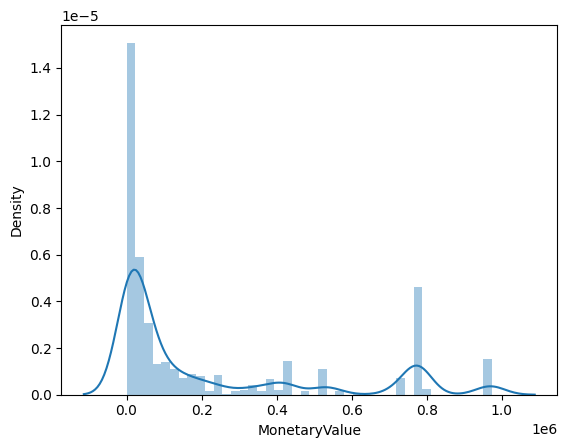

In [ ]:
x = df.query('MonetaryValue < 1000000')['MonetaryValue']

ax = sns.distplot(x)

In [ ]:
#Split into four segments using quantiles
quantiles = df.quantile(q=[0.25,0.5,0.75])
quantiles = quantiles.to_dict()

<ipython-input-23-006314bef0a0>:2: FutureWarning:

The default value of numeric_only in DataFrame.quantile is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.



In [ ]:
quantiles

{'CustomerId': {0.25: 100001870.0, 0.5: 100004474.0, 0.75: 100007970.0},
 'SalesOrderLineNumber': {0.25: 10.0, 0.5: 10.0, 0.75: 20.0},
 'Qty': {0.25: 1.0, 0.5: 1.0, 0.75: 4.0},
 'ProductSupplierID': {0.25: 1000033.0, 0.5: 1000079.0, 0.75: 1000171.0},
 'Revenue': {0.25: 40.07684742, 0.5: 127.1295386, 0.75: 502.4031527},
 'Profit': {0.25: 1.25934714, 0.5: 4.729525365, 0.75: 15.88911594},
 'Freight cost': {0.25: 0.68, 0.5: 4.53, 0.75: 4.53},
 'year': {0.25: 2021.0, 0.5: 2021.0, 0.75: 2021.0},
 'Recency': {0.25: 0.0, 0.5: 0.0, 0.75: 0.0},
 'Frequency': {0.25: 62.0, 0.5: 820.0, 0.75: 2802.0},
 'MonetaryValue': {0.25: 45581.430348932,
  0.5: 953709.98738989,
  0.75: 1694566.977749088}}

In [ ]:
#Functions to create R, F and M segments
def RScoring(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
    
def FnMScoring(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1

In [ ]:
#Calculate Add R, F and M segment value columns in the existing dataset to show R, F and M segment values
df['R'] = df['Recency'].apply(RScoring, args=('Recency',quantiles,))
df['F'] = df['Frequency'].apply(FnMScoring, args=('Frequency',quantiles,))
df['M'] = df['MonetaryValue'].apply(FnMScoring, args=('MonetaryValue',quantiles,))
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,year,month_year,Recency,Frequency,MonetaryValue,R,F,M
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,0.00,Components North,2021.0,2021-02,0,2802,774373.520893,1,2,3
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,4.53,Corporate North,2021.0,2021-03,0,2802,774373.520893,1,2,3
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,4.53,Corporate North,2021.0,2021-03,0,2802,774373.520893,1,2,3
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,4.53,Components North,2021.0,2021-03,0,2802,774373.520893,1,2,3
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,4.53,Components North,2021.0,2021-06,0,2802,774373.520893,1,2,3


In [ ]:
#Calculate and Add RFMGroup value column showing combined concatenated score of RFM
df['RFMGroup'] = df.R.map(str) + df.F.map(str) + df.M.map(str)

#Calculate and Add RFMScore value column showing total sum of RFMGroup values
df['RFMScore'] = df[['R', 'F', 'M']].sum(axis = 1)
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,...,year,month_year,Recency,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,...,2021.0,2021-02,0,2802,774373.520893,1,2,3,123,6
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,...,2021.0,2021-03,0,2802,774373.520893,1,2,3,123,6
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,...,2021.0,2021-03,0,2802,774373.520893,1,2,3,123,6
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,...,2021.0,2021-03,0,2802,774373.520893,1,2,3,123,6
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,...,2021.0,2021-06,0,2802,774373.520893,1,2,3,123,6


In [ ]:
#Assign Loyalty Level to each customer
Loyalty_Level = ['Platinum', 'Gold', 'Silver', 'Bronze']
Score_cuts = pd.qcut(df.RFMScore, q = 4, labels = Loyalty_Level)
df['RFM_Loyalty_Level'] = Score_cuts.values
df.reset_index().index[100:150]

RangeIndex(start=100, stop=150, step=1)

In [ ]:
#Validate the data for RFMGroup = 111
df[df['RFMGroup']=='111'].sort_values('MonetaryValue', ascending=False).reset_index().head(10)

,index,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,...,month_year,Recency,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore,RFM_Loyalty_Level
0,13575,100007970,2335886,10,2021-03-04,8,Hannspree,Monitors,1000078.0,603.639087,...,2021-03,0,5986,3.960515e+06,1,1,1,111,3,Platinum
1,18164,100007970,3185040,10,2021-12-05,2,Dell,Monitors,1000003.0,405.245642,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
2,18162,100007970,3184802,10,2021-12-05,1,EXC,Adaptors Or Linkers,1000385.0,9.012462,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
3,18161,100007970,3184276,10,2021-12-05,2,WD,Internal SSD,1000043.0,71.730175,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
4,18160,100007970,3184203,10,2021-12-05,1,Kingston,Internal SSD,1000573.0,25.417872,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
5,18159,100007970,3183968,10,2021-12-05,1,Samsung,Memory Cards,1000033.0,12.801650,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
6,18158,100007970,3183579,20,2021-12-05,2,Dell,Keyboard and Mouse,1000003.0,104.776445,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
7,18157,100007970,3187908,10,2021-12-05,1,Dell,Desktop PC,1000003.0,349.331708,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
8,18156,100007970,3186223,10,2021-12-05,3,Dell,Notebook Computers,1000003.0,2495.833984,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum
9,18155,100007970,3188049,10,2021-12-05,1,Seagate,Internal HDD,1000299.0,73.932599,...,2021-12,0,5986,3.960515e+06,1,1,1,111,3,Platinum


In [ ]:
import chart_studio as cs
import plotly.offline as po
import plotly.graph_objs as gobj

#Recency Vs Frequency
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]
plot_layout = gobj.Layout(
        yaxis= {'title': "Frequency"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

#Frequency Vs Monetary
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
       gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Frequency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]
plot_layout = gobj.Layout(
        yaxis= {'title': "Monetary"},
        xaxis= {'title': "Frequency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

#Recency Vs Monetary
graph = df.query("MonetaryValue < 5000000 and Frequency < 20000")

plot_data = [
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Bronze'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Bronze'")['MonetaryValue'],
        mode='markers',
        name='Bronze',
        marker= dict(size= 7,
            line= dict(width=1),
            color= 'blue',
            opacity= 0.8
           )
    ),
        gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Silver'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Silver'")['MonetaryValue'],
        mode='markers',
        name='Silver',
        marker= dict(size= 9,
            line= dict(width=1),
            color= 'green',
            opacity= 0.5
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Gold'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Gold'")['MonetaryValue'],
        mode='markers',
        name='Gold',
        marker= dict(size= 11,
            line= dict(width=1),
            color= 'red',
            opacity= 0.9
           )
    ),
    gobj.Scatter(
        x=graph.query("RFM_Loyalty_Level == 'Platinum'")['Recency'],
        y=graph.query("RFM_Loyalty_Level == 'Platinum'")['MonetaryValue'],
        mode='markers',
        name='Platinum',
        marker= dict(size= 13,
            line= dict(width=1),
            color= 'black',
            opacity= 0.9
           )
    ),
]

plot_layout = gobj.Layout(
        yaxis= {'title': "Monetary"},
        xaxis= {'title': "Recency"},
        title='Segments'
    )
fig = gobj.Figure(data=plot_data, layout=plot_layout)
po.iplot(fig)

The code above creates three scatter plots to visualize the RFM analysis.

The first plot visualizes the Recency vs Frequency by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how recently they have made a purchase and how frequently they purchase.

The second plot visualizes the Frequency vs Monetary by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how frequently they purchase and how much they spend.

The third plot visualizes the Recency vs Monetary by the different customer segments. The four customer segments (Bronze, Silver, Gold, and Platinum) are plotted using different colors and marker sizes. The plot helps to visualize how the customer segments differ in terms of how recently they have made a purchase and how much they spend.

All the plots use the same data, which has been filtered to exclude outliers.

K-Means Clustering

In [ ]:
#Handle negative and zero values so as to handle infinite numbers during log transformation
def handle_neg_n_zero(num):
    if num <= 0:
        return 1
    else:
        return num
#Apply handle_neg_n_zero function to Recency and Monetary columns 
df['Recency'] = [handle_neg_n_zero(x) for x in df.Recency]
df['MonetaryValue'] = [handle_neg_n_zero(x) for x in df.MonetaryValue]

#Perform Log transformation to bring data into normal or near normal distribution
Log_Tfd_Data = df[['Recency', 'Frequency', 'MonetaryValue']].apply(np.log, axis = 1).round(3)

This code handles negative and zero values by replacing them with 1, which is a common approach when dealing with logarithmic transformations. This avoids errors and infinite values that can occur when taking the logarithm of values less than or equal to zero.

The code then applies a logarithmic transformation to the 'Recency', 'Frequency', and 'MonetaryValue' columns using the NumPy log function. This can help to normalize the distribution of the data and improve the performance of certain machine learning models that assume normally distributed data. The resulting transformed data is rounded to 3 decimal places and stored in a new dataframe called Log_Tfd_Data.

<ipython-input-32-a3998907c46f>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




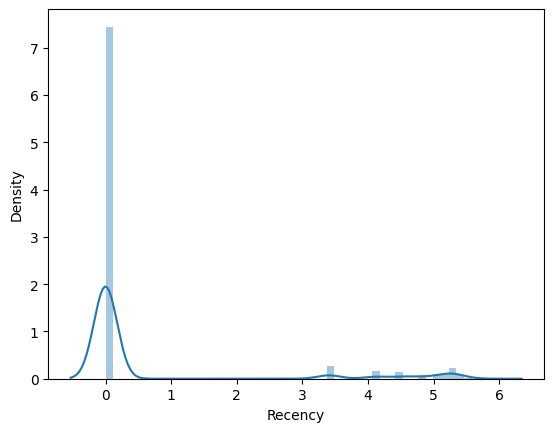

In [ ]:
#Data distribution after data normalization for Recency
Recency_Plot = Log_Tfd_Data['Recency']
ax = sns.distplot(Recency_Plot)

<ipython-input-33-de88ace554c9>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




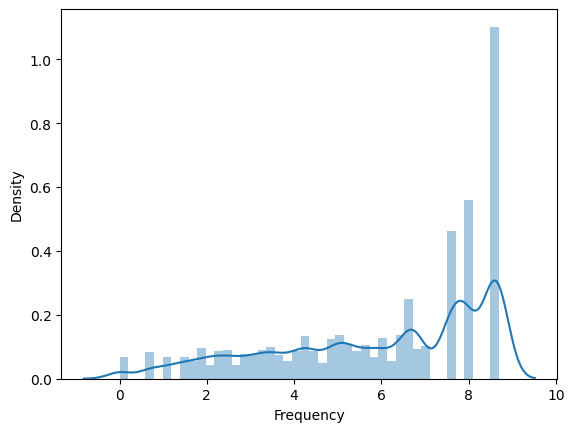

In [ ]:
#Data distribution after data normalization for Frequency
Frequency_Plot = Log_Tfd_Data.query('Frequency < 1000')['Frequency']
ax = sns.distplot(Frequency_Plot)

<ipython-input-34-674b6fecbf20>:3: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




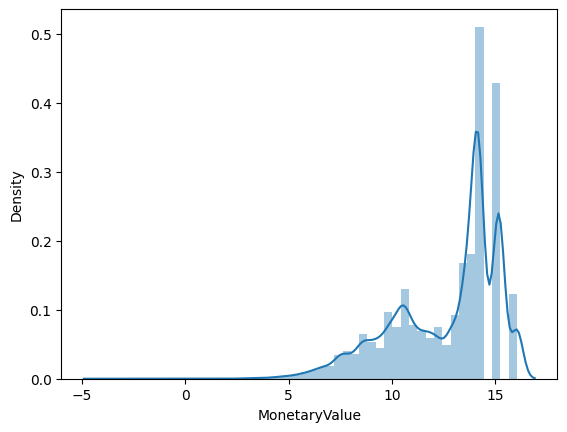

In [ ]:
#Data distribution after data normalization for Monetary
Monetary_Plot = Log_Tfd_Data.query('MonetaryValue < 1000000')['MonetaryValue']
ax = sns.distplot(Monetary_Plot)

In [ ]:
from sklearn.preprocessing import StandardScaler

#Bring the data on same scale
scaleobj = StandardScaler()
Scaled_Data = scaleobj.fit_transform(Log_Tfd_Data)

#Transform it back to dataframe
Scaled_Data = pd.DataFrame(Scaled_Data, index = df.index, columns = Log_Tfd_Data.columns)

#Elbow method to find 'k' in clustering

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change fro

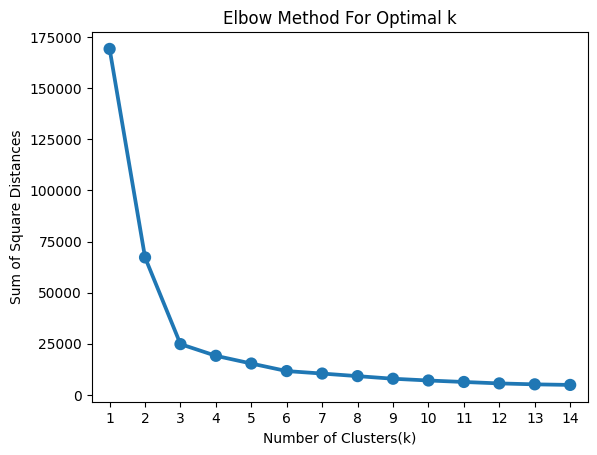

In [ ]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
sum_of_sq_dist = {}
for k in range(1,15):
    km = KMeans(n_clusters= k, init= 'k-means++', max_iter= 1000)
    km = km.fit(Scaled_Data)
    sum_of_sq_dist[k] = km.inertia_
    
#Plot the graph for the sum of square distance values and Number of Clusters
sns.pointplot(x = list(sum_of_sq_dist.keys()), y = list(sum_of_sq_dist.values()))
plt.xlabel('Number of Clusters(k)')
plt.ylabel('Sum of Square Distances')
plt.title('Elbow Method For Optimal k')
plt.show()

 elbow method to determine the optimal number of clusters for KMeans clustering. It loops through different values of k (number of clusters) and calculates the sum of squared distances of each point in a cluster from the centroid of that cluster. It then plots a graph of the sum of squared distances versus the number of clusters.

The "elbow" in the plot represents the point of diminishing returns, beyond which adding more clusters doesn't improve the clustering performance significantly. The optimal number of clusters is chosen at this "elbow" point.

In this case, it seems that the optimal number of clusters is 3, as that is where the elbow in the plot occurs.

In [ ]:
#Perform K-Mean Clustering or build the K-Means clustering model
KMean_clust = KMeans(n_clusters= 4, init= 'k-means++', max_iter= 1000)
KMean_clust.fit(Scaled_Data)

#Find the clusters for the observation given in the dataset
df['Cluster'] = KMean_clust.labels_
df.head()

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,...,Recency,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore,RFM_Loyalty_Level,Cluster
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,...,1,2802,774373.520893,1,2,3,123,6,Gold,2
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,...,1,2802,774373.520893,1,2,3,123,6,Gold,2
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,...,1,2802,774373.520893,1,2,3,123,6,Gold,2
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,...,1,2802,774373.520893,1,2,3,123,6,Gold,2
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,...,1,2802,774373.520893,1,2,3,123,6,Gold,2


<Figure size 700x700 with 0 Axes>

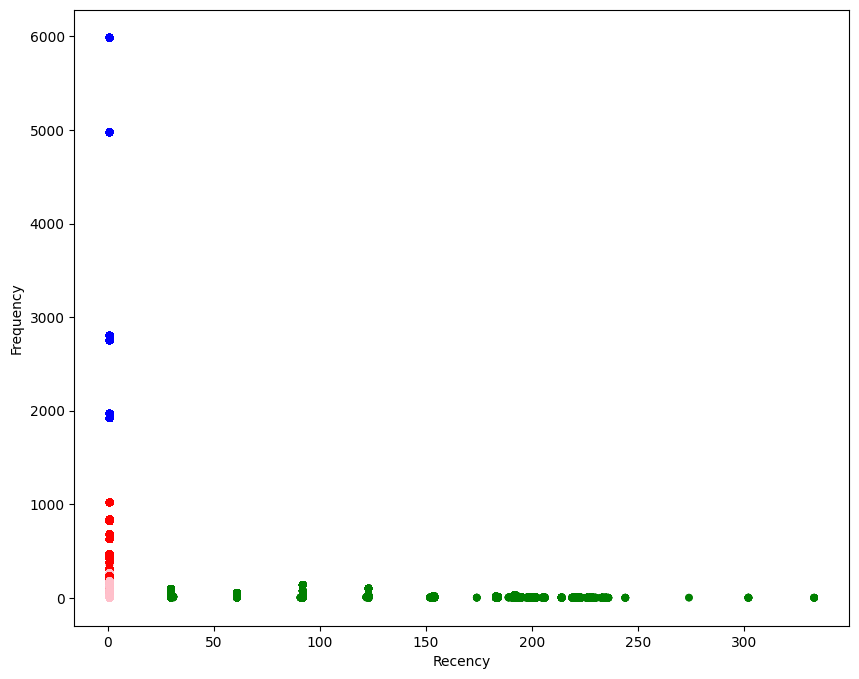

In [ ]:
from matplotlib import pyplot as plt
plt.figure(figsize=(7,7))

##Scatter Plot Frequency Vs Recency
Colors = ["red", "green", "blue", "pink"]
df['Color'] = df['Cluster'].map(lambda p: Colors[p])
ax = df.plot(    
    kind="scatter", 
    x="Recency", y="Frequency",
    figsize=(10,8),
    c = df['Color']
)

In [ ]:
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,...,Frequency,MonetaryValue,R,F,M,RFMGroup,RFMScore,RFM_Loyalty_Level,Cluster,Color
0,100002803,2913843,10,2021-02-04,2,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,...,2802,774373.520893,1,2,3,123,6,Gold,2,blue
1,100002803,2922507,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,595.090807,11.269791,...,2802,774373.520893,1,2,3,123,6,Gold,2,blue
2,100002803,2925823,10,2021-03-04,1,Dell,Notebook Computers,1000003.0,536.574878,10.814564,...,2802,774373.520893,1,2,3,123,6,Gold,2,blue
3,100002803,2926127,10,2021-03-04,1,Startech,USB Cables,1000171.0,1.247147,0.035051,...,2802,774373.520893,1,2,3,123,6,Gold,2,blue
4,100002803,2929031,10,2021-06-04,1,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,...,2802,774373.520893,1,2,3,123,6,Gold,2,blue


In [ ]:
df.columns

Index(['CustomerId', 'SalesOrderNumber', 'SalesOrderLineNumber', 'ShipDate',
       'Qty', 'Brand', 'ProductType', 'ProductSupplierID', 'Revenue', 'Profit',
       'Freight cost', 'SalesTeamName', 'year', 'month_year', 'Recency',
       'Frequency', 'MonetaryValue', 'R', 'F', 'M', 'RFMGroup', 'RFMScore',
       'RFM_Loyalty_Level', 'Cluster', 'Color'],
      dtype='object')

<Figure size 1000x800 with 0 Axes>

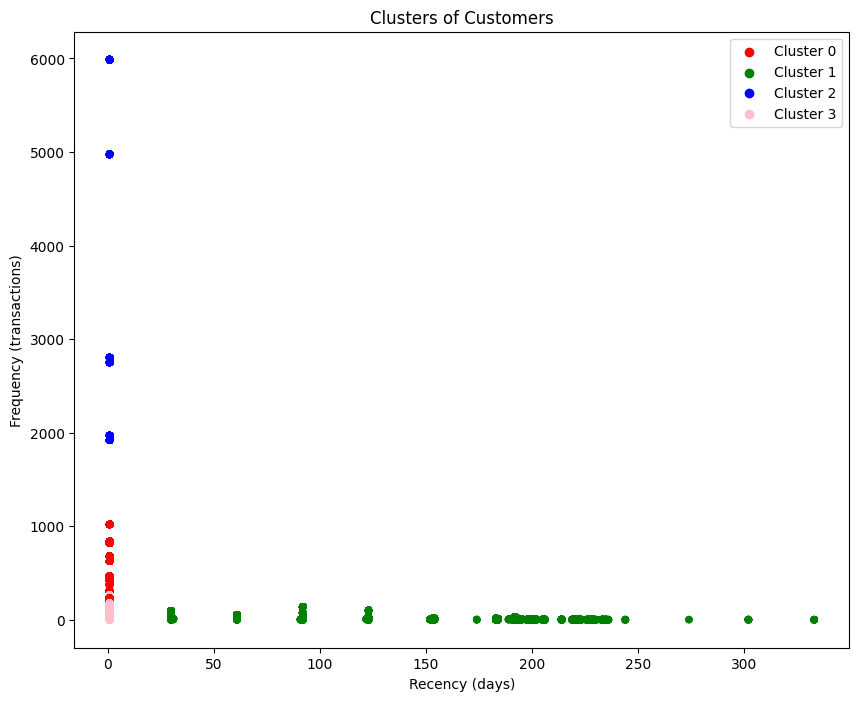

In [ ]:
from matplotlib import pyplot as plt

plt.figure(figsize=(10,8))

# Define colors for each cluster
colors = ["red", "green", "blue", "pink"]
df['Color'] = df['Cluster'].map(lambda p: colors[p])

# Create scatter plot
ax = df.plot(
    kind="scatter",
    x="Recency",
    y="Frequency",
    c=df['Color'],
    figsize=(10,8)
)

# Add legend
for i, color in enumerate(colors):
    ax.scatter([], [], c=color, label=f'Cluster {i}')
ax.legend()
plt.title('Clusters of Customers')
plt.xlabel('Recency (days)')
plt.ylabel('Frequency (transactions)')
plt.show()


<Figure size 1000x800 with 0 Axes>

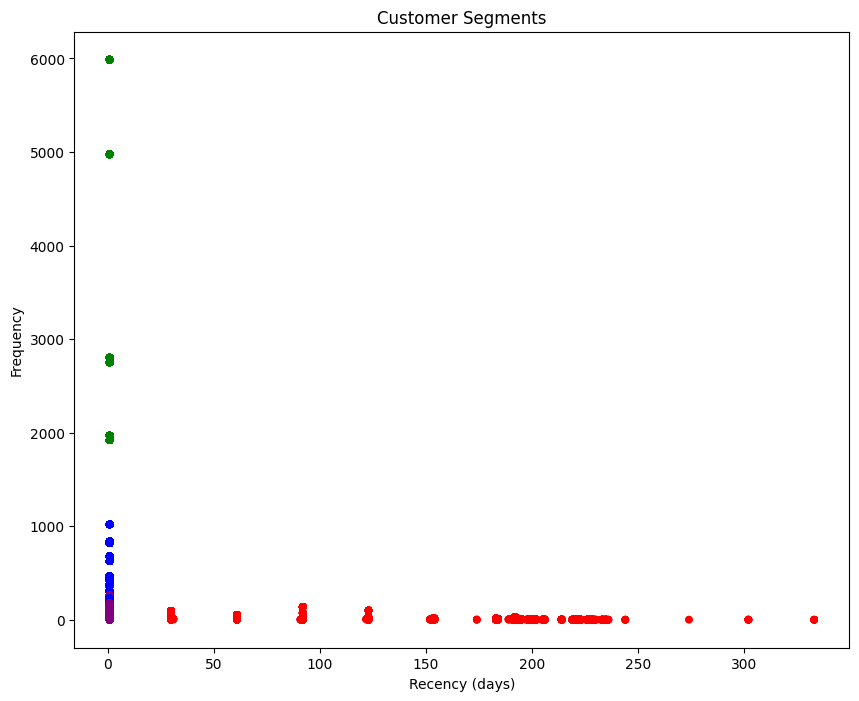

In [ ]:
# Map cluster labels to customer segments
cluster_map = {0: 'bronze', 1: 'platinum', 2: 'silver', 3: 'gold'}
df['Segment'] = df['Cluster'].map(cluster_map)

# Plot scatter plot with color-coded segments
plt.figure(figsize=(10, 8))
colors = ['blue', 'red', 'green', 'purple']
df['Color'] = df['Segment'].map(lambda x: colors[list(cluster_map.values()).index(x)])
ax = df.plot(kind='scatter', x='Recency', y='Frequency', c=df['Color'], figsize=(10, 8))
ax.set_xlabel('Recency (days)')
ax.set_ylabel('Frequency')
ax.set_title('Customer Segments')
plt.show()


In [ ]:
import plotly.express as px

fig = px.scatter_3d(df, x='Recency', y='Frequency', z='MonetaryValue',
              color='Cluster', opacity=0.8, size_max=5)

fig.update_layout(scene=dict(xaxis_title='Recency', yaxis_title='Frequency', zaxis_title='MonetaryValue'),
                  title='3D Cluster Visualization')

fig.show()


IndexError: ignored

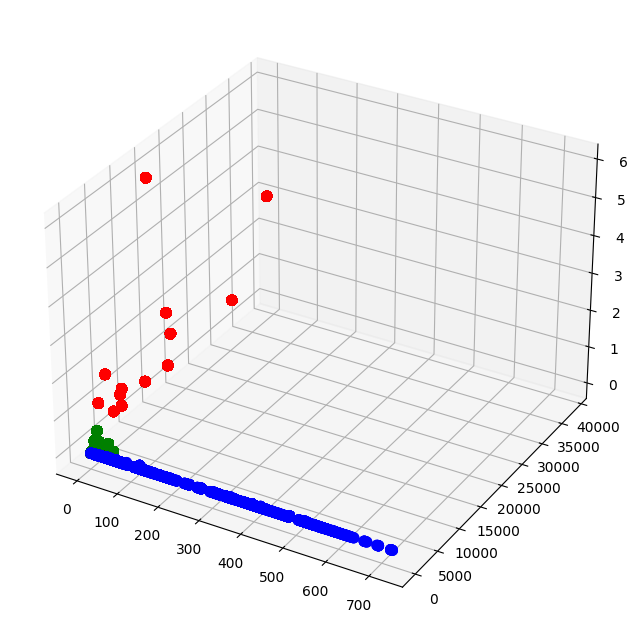

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Create sample data
data = pd.DataFrame({
    'Feature 1': df.Recency,
    'Feature 2': df.Frequency,
    'Feature 3': df.MonetaryValue,
    'Cluster': df.Cluster
})

# Define colors for clusters
colors = ['r', 'g', 'b']

# Create a 3D plot
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Create scatter plot with cluster coloring
for i, c in enumerate(df['Cluster'].unique()):
    subset = df[df['Cluster'] == c]
    ax.scatter(subset['Recency'], subset['Frequency'], subset['MonetaryValue'], c=colors[i], label=f'Cluster {c}', s=50)

# Set axis labels and legend
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
ax.legend()

# Show the plot
plt.show()


In [ ]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df[['Frequency']])
df['FrequencyCluster'] = kmeans.predict(df[['Frequency']])

In [ ]:
plot_data = [
    go.Histogram(
        x=df['Frequency']
    )
]

plot_layout = go.Layout(
        title='Frequency'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [ ]:
plot_data = [
    go.Histogram(
        x=df['MonetaryValue']
    )
]

plot_layout = go.Layout(
        title='MonetaryValue'
    )
fig = go.Figure(data=plot_data, layout=plot_layout)
pyoff.iplot(fig)

In [ ]:
df.MonetaryValue.min()

0.00806402

In [ ]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df[['Recency']])
df['RecencyCluster'] = kmeans.predict(df[['Recency']])

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
kmeans = KMeans(n_clusters=4)
kmeans.fit(df[['MonetaryValue']])
df['MonetaryCluster'] = kmeans.predict(df[['MonetaryValue']])

/usr/local/lib/python3.9/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


In [ ]:
df.head()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,Recency,Frequency,MonetaryValue,FrequencyCluster,RecencyCluster,MonetaryCluster
0,100002803,2913843.0,10.0,2021-02-04,2.0,Microsoft,Operating System Software,1000477.0,254.213783,1.271048,0.00,Components North,0,5724,4.911677e+06,2,3,3
1,100002803,2922507.0,10.0,2021-03-04,1.0,Dell,Notebook Computers,1000003.0,595.090807,11.269791,4.53,Corporate North,0,5724,4.911677e+06,2,3,3
2,100002803,2925823.0,10.0,2021-03-04,1.0,Dell,Notebook Computers,1000003.0,536.574878,10.814564,4.53,Corporate North,0,5724,4.911677e+06,2,3,3
3,100002803,2926127.0,10.0,2021-03-04,1.0,Startech,USB Cables,1000171.0,1.247147,0.035051,4.53,Components North,0,5724,4.911677e+06,2,3,3
4,100002803,2929031.0,10.0,2021-06-04,1.0,Startech,Computer Cooling Fan,1000171.0,1.494133,0.044620,4.53,Components North,0,5724,4.911677e+06,2,3,3


In [ ]:
df['OverallScore'] = df['RecencyCluster'] + df['FrequencyCluster'] + df['MonetaryCluster']

In [ ]:
df['Segment'] = 'Low-Value'
df.loc[df['OverallScore']>2,'Segment'] = 'Mid-Value' 
df.loc[df['OverallScore']>4,'Segment'] = 'High-Value'

In [ ]:
df.tail()

,CustomerId,SalesOrderNumber,SalesOrderLineNumber,ShipDate,Qty,Brand,ProductType,ProductSupplierID,Revenue,Profit,Freight cost,SalesTeamName,Recency,Frequency,MonetaryValue,FrequencyCluster,RecencyCluster,MonetaryCluster,OverallScore,Segment
303097,100000562,NaN,10.0,2022-11-08,1.0,Philips,Public Displays,1000351.0,313.991343,16.463923,2.24,Corporate South,30,0,1835.205258,0,0,0,0,Low-Value
303098,100000562,NaN,20.0,2022-11-08,2.0,Peerless,Wall Mounts,1000065.0,65.397362,13.899802,1.90,Corporate South,30,0,1835.205258,0,0,0,0,Low-Value
303099,100000562,NaN,30.0,2022-11-08,1.0,Philips,Public Displays,1000351.0,526.976894,24.603243,4.03,Corporate South,30,0,1835.205258,0,0,0,0,Low-Value
303100,100000562,NaN,40.0,2022-11-08,1.0,Optoma,Data Projectors,1000083.0,928.839658,54.419883,1.21,Corporate South,30,0,1835.205258,0,0,0,0,Low-Value
303101,100012128,NaN,10.0,2022-11-08,1.0,Lenovo,Professional Desktop PC,1000133.0,441.657912,5.848959,4.89,SMB 1 North,30,0,441.657912,0,0,0,0,Low-Value
